In [1]:
import os
import numpy as np
import pandas as pd
import seaborn as sns

In [2]:
plt.rcParams['figure.dpi'] = 300
sns.set_context('talk', font_scale= 1.2)

# Figure 2B

In [31]:
subsample_path = '/Users/bendalllab/Documents/PlacentaMAExpression'

In [32]:
dec_pheno_csv = 'decidua_sample_info.csv'
pheno_filepath = os.path.join(subsample_path, dec_pheno_csv)
pheno = pd.read_csv(pheno_filepath, index_col = 0)

In [33]:
dec_immune_vals_csv = 'decidua_immune_exprs.csv'
immune_vals_filepath = os.path.join(subsample_path, dec_immune_vals_csv)
immune_vals = pd.read_csv(immune_vals_filepath, index_col = 0)

In [34]:
immune_dec_ch_csv = 'ch_dec_immune_info.csv'
ch_info_filepath = os.path.join(subsample_path, immune_dec_ch_csv)
ch_info = pd.read_csv(ch_info_filepath, index_col = 0)
imm_ch_genes = ch_info['Symbol'].unique()

In [35]:
sample_dict = pheno['day'].to_dict()
gene_probe_dict = immune_vals['Symbol'].to_dict()
immune_t = immune_vals.loc[:, 'GSM282835': 'GSM282850'].transpose()
immune_heatmap = immune_t.transpose()
immune_heatmap.rename(index = gene_probe_dict, columns = sample_dict, inplace = True)
decidua_imm_ch = immune_heatmap[immune_heatmap.index.str.upper().isin(imm_ch_genes)]

In [36]:
dec_immune_ch_csv = '20200826_decidua_immune_ch.csv'
dec_immune_ch_filepath = os.path.join(subsample_path, dec_immune_ch_csv)
decidua_imm_ch.to_csv(dec_immune_ch_filepath, index = False)

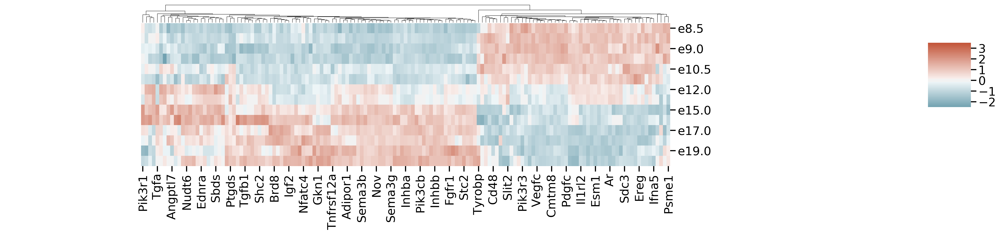

In [41]:
cg = sns.clustermap(decidua_imm_ch.transpose(), figsize=(20, 5),
               z_score = 1, center = 0,cmap = sns.diverging_palette(220, 20, n=200),
               row_cluster = False, col_cluster = True, vmin=-2.5, vmax=3.5)
plt.setp(cg.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
cg.cax.set_position((1.2,0.4,.05,.3))

In [38]:
vasc_dec_ch_csv = 'ch_dec_vasc_info.csv'
ch_vasc_expr_filepath = os.path.join(subsample_path, vasc_dec_ch_csv)
ch_vasc_expr = pd.read_csv(ch_vasc_expr_filepath, index_col = 0)

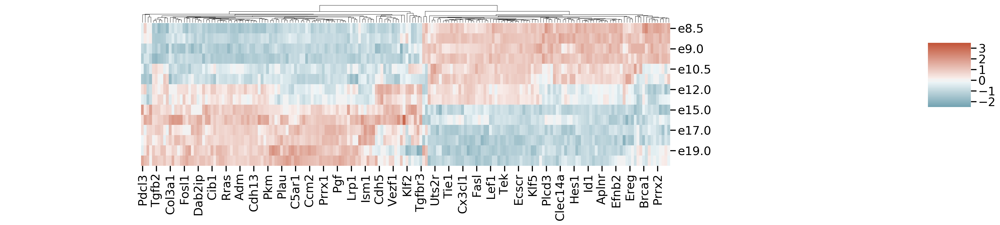

In [42]:
plt.rcParams['figure.dpi'] = 180
cg = sns.clustermap(ch_vasc_expr.transpose(), figsize=(20, 5),
               z_score = 1, center = 0,cmap = sns.diverging_palette(220, 20, n=200),
               row_cluster = False, col_cluster = True, vmin=-2.5, vmax=3.5)
plt.setp(cg.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
cg.cax.set_position((1.2,0.4,.05,.3))

# Figure 2C

In [3]:
subsample_path = '/Users/bendalllab/Desktop/Maternal_cells/500_sub'
counts_csv = '20200521_maternal500wo_outliers_counts_per_sample_meta_clust.csv'
counts_filepath = os.path.join(subsample_path, counts_csv)
cell_counts = pd.read_csv(counts_filepath)

In [4]:
days_int = ['E10.5', 'E14.5', 'E18.5']

In [10]:
cell_type = cell_counts['cell_type_v2'].unique().tolist()

In [11]:
cell_counts.head(5)

,cell_type_v2,compartment,organ,location,day,challenge,timePI,cage,id,test_status,counts,sample,sample_total,frac_of_comp_sample,compartment2
0,B cells,PB-EV,PB,EV,E10.5,sal,2hr,6942,8,test,194,6942_8_E10.5_sal_2hr_PB_EV,494,0.392713,PB-EV
1,B cells,PB-EV,PB,EV,E10.5,sal,2hr,6943,15,test,251,6943_15_E10.5_sal_2hr_PB_EV,484,0.518595,PB-EV
2,B cells,PB-EV,PB,EV,E10.5,sal,2hr,6944,16,test,142,6944_16_E10.5_sal_2hr_PB_EV,496,0.286290,PB-EV
3,B cells,PB-EV,PB,EV,E10.5,sal,2hr,6944,17,test,242,6944_17_E10.5_sal_2hr_PB_EV,485,0.498969,PB-EV
4,B cells,PB-EV,PB,EV,E10.5,sal,2hr,9582,15,test,135,9582_15_E10.5_sal_2hr_PB_EV,459,0.294118,PB-EV


In [12]:
cell_counts['test_status'].unique()

array(['test'], dtype=object)

In [7]:
from scipy.stats import ttest_ind

In [13]:
days = [('E10.5', 'E14.5'), ('E14.5', 'E18.5'), ('E18.5', 'E10.5')]
compartments = ['PL-T', 'PL-EV', 'PB-EV']
t_test_cell_frac = pd.DataFrame(columns =['cell_type', 'compartment','day1', 'day2', 't-stat_day', 'p-value_day', 'Stat diff day'])

for cell in cell_type:   
    for comp in compartments:
        for day in days: 
                day1 = cell_counts[(cell_counts['cell_type_v2']== cell) & 
                                        (cell_counts['compartment2']== comp)&
                                        (cell_counts['day']== day[0])]
                day2 = cell_counts[(cell_counts['cell_type_v2']== cell) & 
                                        (cell_counts['compartment2']== comp)&
                                        (cell_counts['day']== day[1])]

                t_stat_day, p_day = ttest_ind(day1['frac_of_comp_sample'], day2['frac_of_comp_sample'])
                alpha = 0.05
                if p_day > alpha:
                    dist_day = 'no'
                else:
                    dist_day = 'yes'


                data_df = pd.DataFrame(data ={'cell_type': [cell],
                                              'compartment': [comp],
                                              'day1':[day[0]],
                                              'day2':[day[1]],
                                              't-stat_day': [t_stat_day], 
                                              'p-value_day': [p_day], 
                                              'Stat diff day':[ dist_day]})
                t_test_cell_frac = t_test_cell_frac.append(data_df)

In [15]:
t_test_cell_frac['cell_type'].unique()

array(['B cells', 'Basophils', 'CD4+ T cells', 'CD8+ T cells',
       'Eosinophils', 'Monocytes', 'NK cells', 'Neutrophils'],
      dtype=object)

In [24]:
t_test_cell_frac[t_test_cell_frac['cell_type']== 'Eosinophils']

,cell_type,compartment,day1,day2,t-stat_day,p-value_day,Stat diff day
0,Eosinophils,PL-T,E10.5,E14.5,-1.820803,0.091724,no
0,Eosinophils,PL-T,E14.5,E18.5,3.142263,0.007787,yes
0,Eosinophils,PL-T,E18.5,E10.5,-1.939677,0.081124,no
0,Eosinophils,PL-EV,E10.5,E14.5,0.909003,0.382833,no
0,Eosinophils,PL-EV,E14.5,E18.5,-0.998480,0.334993,no
0,Eosinophils,PL-EV,E18.5,E10.5,0.303103,0.767466,no
0,Eosinophils,PB-EV,E10.5,E14.5,1.607172,0.146684,no
0,Eosinophils,PB-EV,E14.5,E18.5,-0.015204,0.988242,no
0,Eosinophils,PB-EV,E18.5,E10.5,-1.665254,0.134427,no


In [6]:
TIS = cell_counts[(cell_counts['compartment2'] == 'PL-T') & cell_counts['day'].isin(days_int)]
EV = cell_counts[(cell_counts['compartment2'] == 'PL-EV') & cell_counts['day'].isin(days_int)]
PB = cell_counts[(cell_counts['compartment2'] == 'PB-EV') & cell_counts['day'].isin(days_int)]

(0, 0.8)

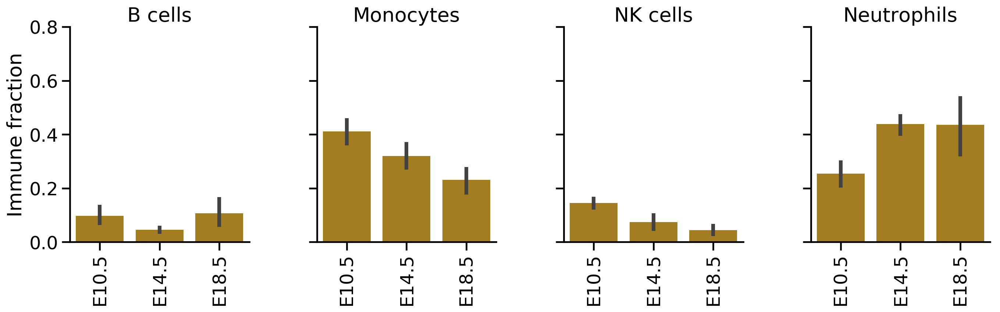

In [7]:
plt.rcParams['figure.dpi'] = 180
sns.set_context('talk', font_scale= 1.2)
g = sns.catplot(x='day', y='frac_of_comp_sample',
                col = 'cell_type_v2', data= TIS[TIS['cell_type_v2'].isin(['Monocytes', 'Neutrophils', 'B cells', 'NK cells'])], color ='darkgoldenrod', kind='bar',
                sharey = True,
                aspect=0.8)

(g.set_axis_labels('', 'Immune fraction')
  .set_titles('{col_name}'))  
[plt.setp(ax.get_xticklabels(), rotation=90) for ax in g.axes.flat];
plt.ylim(0, 0.8)

(0, 0.15)

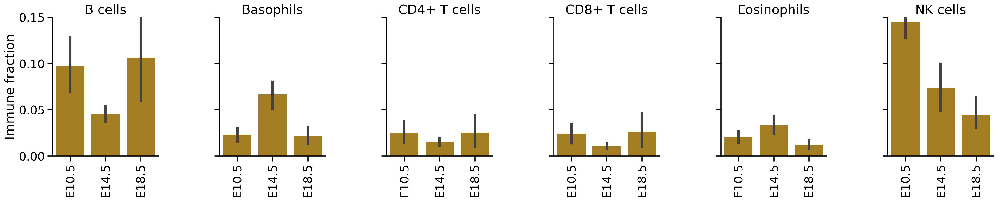

In [33]:
plt.rcParams['figure.dpi'] = 180
sns.set_context('talk', font_scale= 1.2)
g = sns.catplot(x='day', y='frac_of_comp_sample',
                col = 'cell_type_v2', data= TIS[TIS['cell_type_v2'].isin(['B cells',
                                                                          'Basophils',
                                                                          'CD4+ T cells',
                                                                          'CD8+ T cells',
                                                                          'Eosinophils',
                                                                          'NK cells'])], 
                color ='darkgoldenrod', kind='bar',
                sharey = True,
                aspect=0.8)

(g.set_axis_labels('', 'Immune fraction')
  .set_titles('{col_name}'))  
[plt.setp(ax.get_xticklabels(), rotation=90) for ax in g.axes.flat];
plt.ylim(0, 0.15)

(0, 0.8)

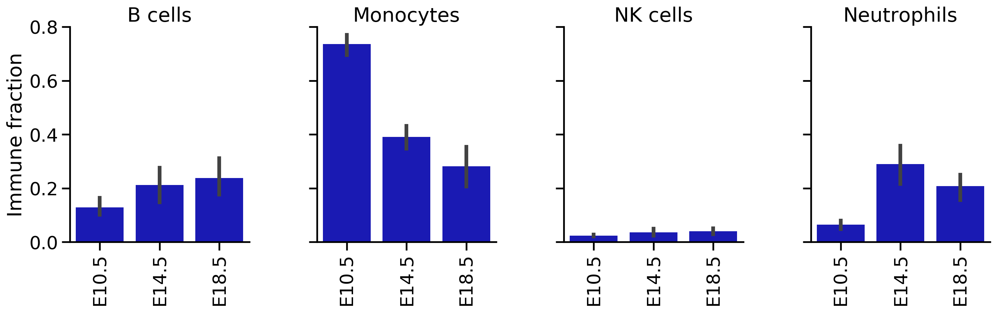

In [8]:
plt.rcParams['figure.dpi'] = 180
sns.set_context('talk', font_scale= 1.2)
g = sns.catplot(x='day', y='frac_of_comp_sample',
                col = 'cell_type_v2', data= EV[EV['cell_type_v2'].isin(['B cells','Monocytes', 'Neutrophils', 'NK cells'])], color = 'mediumblue', kind='bar',
                sharey = True,
                aspect=0.8)

(g.set_axis_labels('', 'Immune fraction')
  .set_titles('{col_name}'))  
[plt.setp(ax.get_xticklabels(), rotation=90) for ax in g.axes.flat];
plt.ylim(0, 0.8)

(0, 0.15)

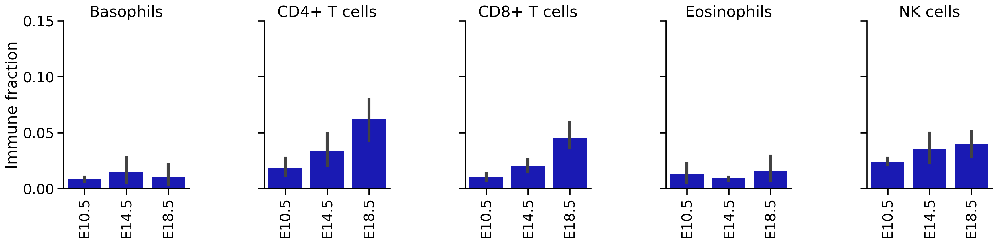

In [31]:
plt.rcParams['figure.dpi'] = 180
sns.set_context('talk', font_scale= 1.2)
g = sns.catplot(x='day', y='frac_of_comp_sample',
                col = 'cell_type_v2', data= EV[EV['cell_type_v2'].isin(['Basophils',
                                                                        'CD4+ T cells',
                                                                        'CD8+ T cells',
                                                                        'Eosinophils',
                                                                        'NK cells'])], 
                color = 'mediumblue', kind='bar',
                sharey = True,
                aspect=0.8)

(g.set_axis_labels('', 'Immune fraction')
  .set_titles('{col_name}'))  
[plt.setp(ax.get_xticklabels(), rotation=90) for ax in g.axes.flat];
plt.ylim(0, 0.15)

(0, 0.8)

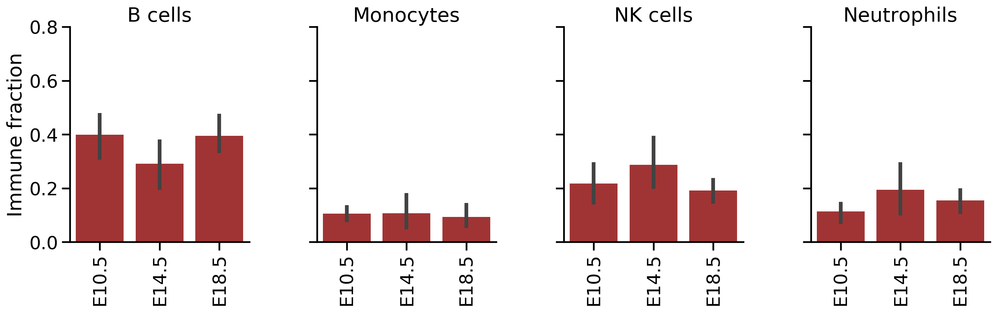

In [36]:
plt.rcParams['figure.dpi'] = 180
sns.set_context('talk', font_scale= 1.2)
g = sns.catplot(x='day', y='frac_of_comp_sample',
                col = 'cell_type_v2', data= PB[PB['cell_type_v2'].isin(['B cells', 'Neutrophils', 'Monocytes','NK cells'])], 
                color = 'firebrick', kind='bar',
                sharey = True,
                aspect=0.8)

(g.set_axis_labels('', 'Immune fraction')
  .set_titles('{col_name}'))  
[plt.setp(ax.get_xticklabels(), rotation=90) for ax in g.axes.flat];
plt.ylim(0, 0.8)

(0, 0.15)

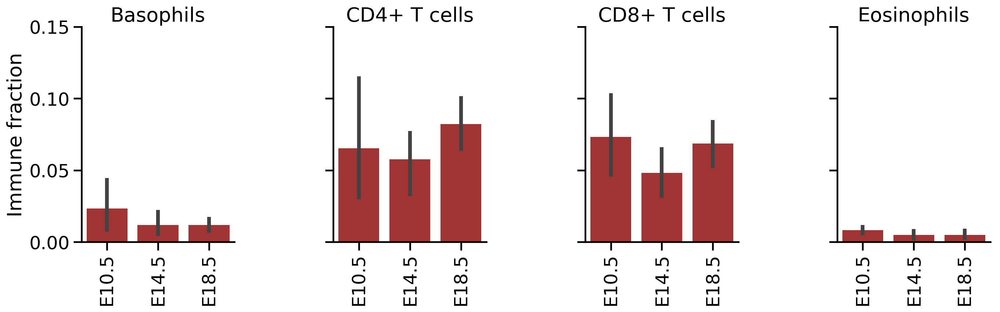

In [37]:
plt.rcParams['figure.dpi'] = 180
sns.set_context('talk', font_scale= 1.2)
g = sns.catplot(x='day', y='frac_of_comp_sample',
                col = 'cell_type_v2', data= PB[PB['cell_type_v2'].isin(['Basophils',
                                                                        'CD4+ T cells',
                                                                        'CD8+ T cells',
                                                                        'Eosinophils'])], color = 'firebrick', kind='bar',
                sharey = True,
                aspect=0.8)

(g.set_axis_labels('', 'Immune fraction')
  .set_titles('{col_name}'))  
[plt.setp(ax.get_xticklabels(), rotation=90) for ax in g.axes.flat];
plt.ylim(0, 0.15)

# Figure 2D

In [9]:
cell_list = cell_counts['cell_type_v2'].unique().tolist()
compartments = cell_counts['compartment2'].unique().tolist()
cell_counts_piv = cell_counts.groupby(['cell_type_v2', 'compartment2', 'day']).mean()
cell_counts_piv.reset_index(inplace = True)
cell_frac = cell_counts_piv[['cell_type_v2', 'compartment2', 'day', 'frac_of_comp_sample']]

In [10]:
leiden_color_dictv2 = {'B cells': '#FFFF00',
 'CD4+ T cells': '#FF34FF',
 'CD8+ T cells': '#FF4A46',
 'Eosinophils': '#A30059',
 'Basophils': '#b98cdb',
 'Monocytes': '#552de3',
 'NK cells': '#8FB0FF',
 'Neutrophils': '#8393a3',                   
 'DCs': '#1CE6FF'}

comp_dict = {'PB-EV':'firebrick','PL-EV': 'mediumblue', 'PL-T': 'darkgoldenrod'}

In [11]:
TIS_frac = cell_frac[(cell_frac['compartment2']== 'PL-T')]
EV_frac = cell_frac[(cell_frac['compartment2']== 'PL-EV')]
PB_frac = cell_frac[(cell_frac['compartment2']== 'PB-EV')]

In [12]:
TIS_f_piv = TIS_frac.pivot_table(index = 'cell_type_v2', columns = 'day', values = 'frac_of_comp_sample')
EV_f_piv = EV_frac.pivot_table(index = 'cell_type_v2', columns = 'day', values = 'frac_of_comp_sample')
PB_f_piv = PB_frac.pivot_table(index = 'cell_type_v2', columns = 'day', values = 'frac_of_comp_sample')

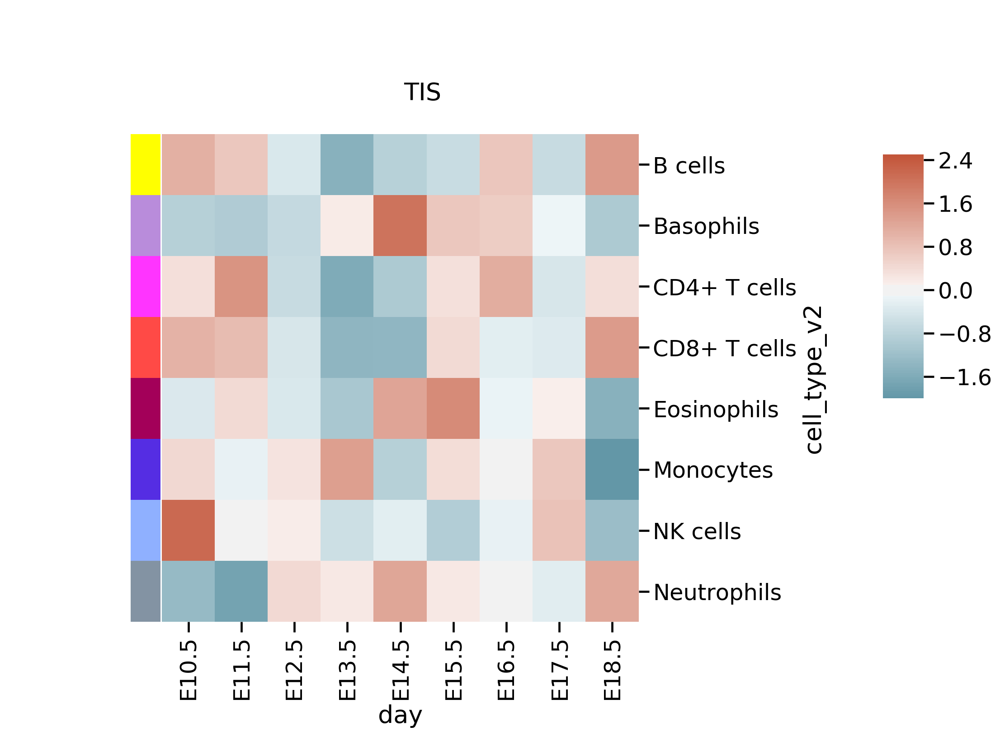

In [58]:
row_colors = TIS_f_piv.index.map(leiden_color_dictv2)
cg = sns.clustermap(TIS_f_piv, figsize=(10, 10),
               cmap = sns.diverging_palette(220, 20, n=200), row_colors = row_colors, 
               row_cluster = False, col_cluster = False, 
               z_score = 0, center = 0,
                  vmin=-2, vmax=2.5)
plt.setp(cg.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
plt.text(-55, 3.5, 'TIS');
cg.cax.set_position((1.2,0.4,.05,.3))

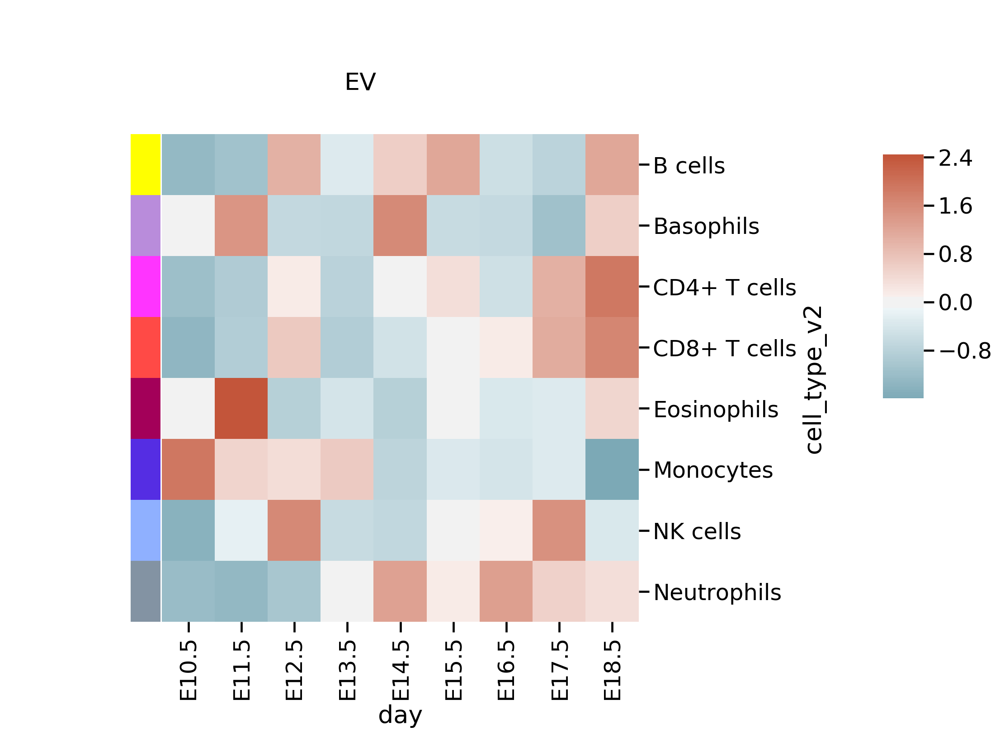

In [49]:
cg = sns.clustermap(EV_f_piv, figsize=(10, 10),
               cmap = sns.diverging_palette(220, 20, n=200), row_colors = row_colors, 
               row_cluster = False, col_cluster = False, 
               z_score = 0, center = 0,
                  vmin=-2, vmax=2.5)
plt.setp(cg.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
plt.text(-55, 3.5, 'EV');
cg.cax.set_position((1.2,0.4,.05,.3))

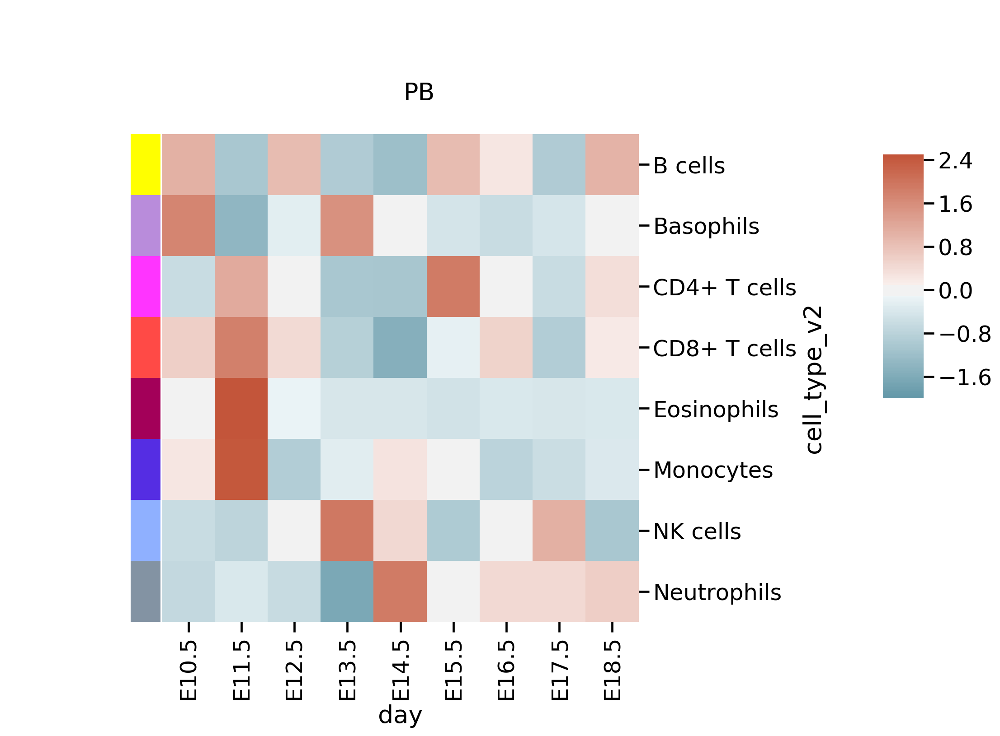

In [59]:
row_colors = PB_f_piv.index.map(leiden_color_dictv2)
cg = sns.clustermap(PB_f_piv, figsize=(10, 10),
               cmap = sns.diverging_palette(220, 20, n=200), row_colors = row_colors, 
               row_cluster = False, col_cluster = False, 
               z_score = 0, center = 0,
               vmin=-2, vmax=2.5)
plt.setp(cg.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
plt.text(-55, 3.5, 'PB');
cg.cax.set_position((1.2,0.4,.05,.3))

In [13]:
Neu = cell_frac[cell_frac['cell_type_v2']== 'Neutrophils']
Mo = cell_frac[cell_frac['cell_type_v2']== 'Monocytes']
Neu_piv = Neu.pivot_table(index = 'compartment2', columns = 'day', values = 'frac_of_comp_sample')
Mo_piv = Mo.pivot_table(index = 'compartment2', columns = 'day', values = 'frac_of_comp_sample')
Neu_piv.sort_index(ascending = False, inplace = True)
Mo_piv.sort_index(ascending = False, inplace = True)

In [28]:
days = ['E10.5', 'E11.5', 'E12.5', 'E13.5', 'E14.5', 'E15.5', 'E16.5', 'E17.5',
       'E18.5']

In [18]:
T_neu = Neu_piv.loc['PL-T'].to_numpy()
EV_neu = Neu_piv.loc['PL-EV'].to_numpy()
PB_neu = Neu_piv.loc['PB-EV'].to_numpy()

T_mo = Mo_piv.loc['PL-T'].to_numpy()
EV_mo = Mo_piv.loc['PL-EV'].to_numpy()
PB_mo = Mo_piv.loc['PB-EV'].to_numpy()

In [20]:
from scipy import stats

In [30]:
Neu_z_score = pd.DataFrame(index = days, data = {'TIS': stats.zscore(T_neu),'EV': stats.zscore(EV_neu), 'PB': stats.zscore(PB_neu)})

In [31]:
Mo_z_score = pd.DataFrame(index = days, data = {'TIS': stats.zscore(T_mo),'EV': stats.zscore(EV_mo), 'PB': stats.zscore(PB_mo)})

In [34]:
Neu_z_score.reset_index(inplace = True)

In [36]:
Neu_z_score.rename(columns = {'index': 'days'}, inplace = True)

In [38]:
Mo_z_score.reset_index(inplace = True)
Mo_z_score.rename(columns = {'index': 'days'}, inplace = True)

In [40]:
Neu_z_melt = Neu_z_score.melt(id_vars = 'days', value_vars = ['TIS', 'EV', 'PB'], var_name = 'compartment', value_name = 'z-score')
Mo_z_melt = Mo_z_score.melt(id_vars = 'days', value_vars = ['TIS', 'EV', 'PB'], var_name = 'compartment', value_name = 'z-score')

In [41]:
Neu_z_melt.head()

,days,compartment,z-score
0,E10.5,TIS,-1.340951
1,E11.5,TIS,-1.862393
2,E12.5,TIS,0.464637
3,E13.5,TIS,0.246120
4,E14.5,TIS,1.303111


In [44]:
comparments_dict = {'PB':'firebrick','EV': 'mediumblue', 'TIS': 'darkgoldenrod'}

Text(0.5, 1.0, 'Neutrophils')

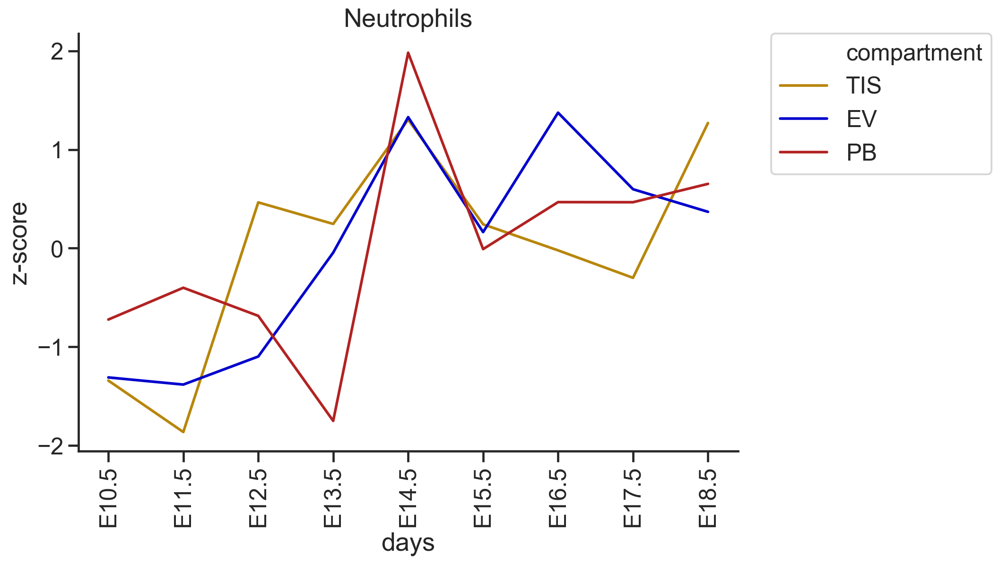

In [52]:
f, ax = plt.subplots(figsize=(10, 6.5))
sns.set_style("ticks")
sns.lineplot(data=Neu_z_melt, x='days', y='z-score', hue = 'compartment', palette = comparments_dict, ax = ax)
plt.xticks(rotation=90)
sns.despine(right = True, top = True)
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('Neutrophils')

Text(0.5, 1.0, 'MPs')

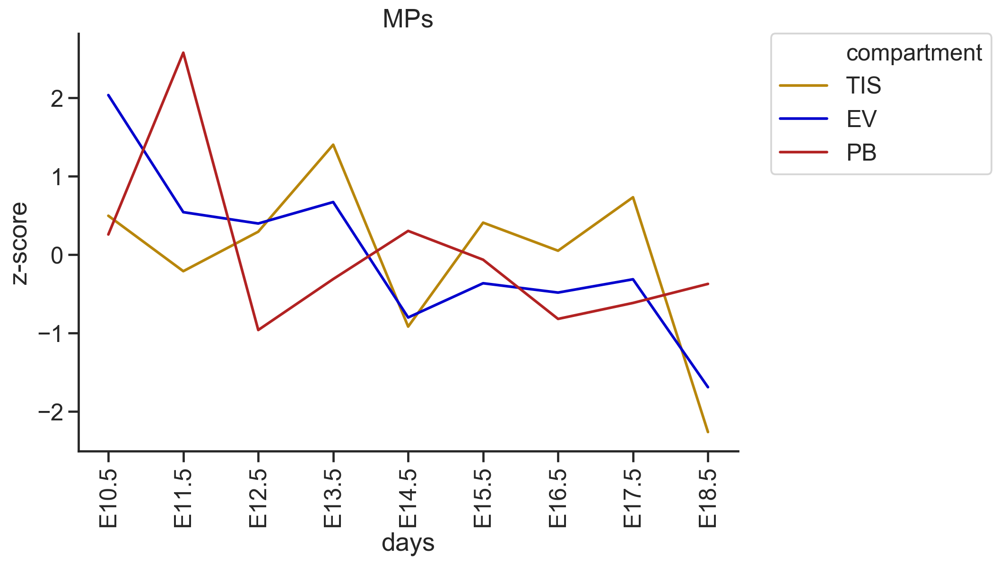

In [53]:
f, ax = plt.subplots(figsize=(10, 6.5))
sns.set_style("ticks")
sns.lineplot(data=Mo_z_melt, x='days', y='z-score', hue = 'compartment', palette = comparments_dict, ax = ax)
plt.xticks(rotation=90)
sns.despine(right = True, top = True)
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.title('MPs')

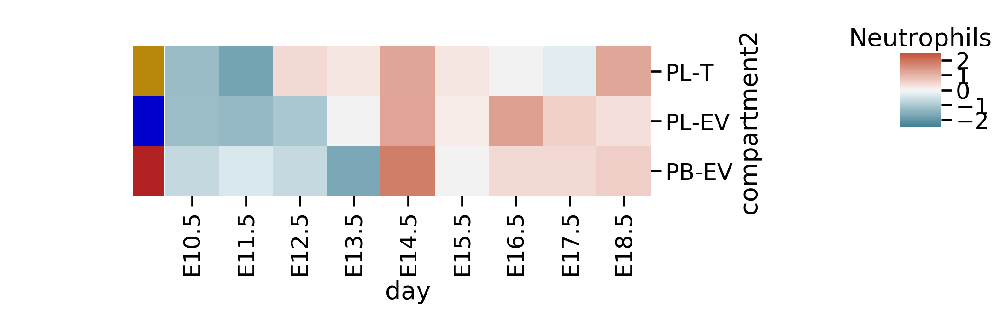

In [52]:
row_colors = Neu_piv.index.map(comp_dict)
plt.rcParams['figure.dpi'] = 180
cg = sns.clustermap(Neu_piv, figsize=(10, 3),
               cmap = sns.diverging_palette(220, 20, n=200), row_colors = row_colors, 
               row_cluster = False, col_cluster = False, 
               z_score = 0, center = 0,
                   vmin=-2.5, vmax=2.5)
plt.setp(cg.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
plt.title('Neutrophils');
cg.cax.set_position((1.2,0.4,.05,.3))

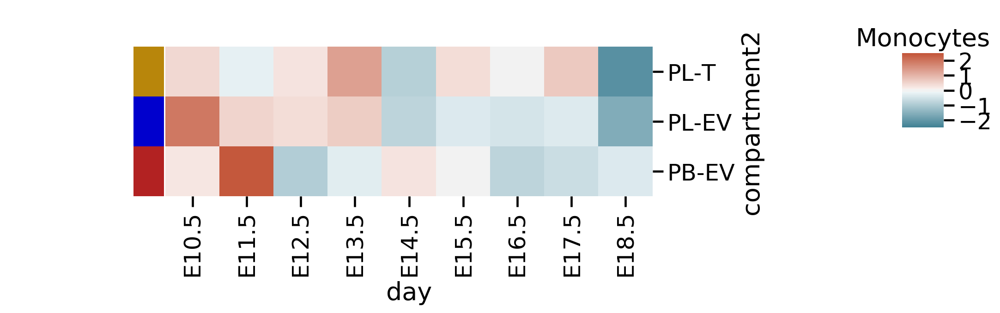

In [53]:
row_colors = Mo_piv.index.map(comp_dict)
plt.rcParams['figure.dpi'] = 180
cg = sns.clustermap(Mo_piv, figsize=(10, 3),
               cmap = sns.diverging_palette(220, 20, n=200), row_colors = row_colors, 
               row_cluster = False, col_cluster = False, 
               z_score = 0, center = 0,
                   vmin=-2.5, vmax=2.5)
plt.setp(cg.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
plt.title('Monocytes');
cg.cax.set_position((1.2,0.4,.05,.3))

# Supplementary Table

In [8]:
subsample_path = '/Users/bendalllab/Desktop/Maternal_cells/500_sub'
ttest_path = os.path.join(subsample_path, '20200831_t_test_cells_all_comp_all_days.csv')
t_test_data = pd.read_csv(ttest_path)

In [9]:
t_test_data.head(5)

,day1,day2,compartment2,cell_type_v2,log2_day2divday1,t-stat,p-value,Stat diff,day2/day1
0,E10.5,E10.5,PB-EV,B cells,0.0,0.0,1.0,no,E10.5/E10.5
1,E10.5,E10.5,PB-EV,Basophils,0.0,0.0,1.0,no,E10.5/E10.5
2,E10.5,E10.5,PB-EV,CD4+ T cells,0.0,0.0,1.0,no,E10.5/E10.5
3,E10.5,E10.5,PB-EV,CD8+ T cells,0.0,0.0,1.0,no,E10.5/E10.5
4,E10.5,E10.5,PB-EV,Eosinophils,0.0,0.0,1.0,no,E10.5/E10.5


In [11]:
t_test_data[(t_test_data['cell_type_v2']=='Neutrophils') & (t_test_data['day2/day1']=='E14.5/E13.5')]

,day1,day2,compartment2,cell_type_v2,log2_day2divday1,t-stat,p-value,Stat diff,day2/day1
607,E13.5,E14.5,PB-EV,Neutrophils,1.237530,-1.543465,0.173664,no,E14.5/E13.5
615,E13.5,E14.5,PL-EV,Neutrophils,0.748669,-2.435140,0.030040,yes,E14.5/E13.5
623,E13.5,E14.5,PL-T,Neutrophils,0.265955,-2.463967,0.028456,yes,E14.5/E13.5


In [7]:
t_test_data.to_csv(ttest_path, index = False)

# Figure 2E

In [25]:
from sklearn.linear_model import Ridge, LinearRegression
from sklearn.model_selection import train_test_split, cross_validate
from sklearn.metrics import mean_squared_error, r2_score

In [26]:
subsample_path = '/Users/bendalllab/Desktop/Maternal_cells/500_sub'
counts_csv = '20200624_maternal500wo_outliers_gen_cell_counts_piv_per_sample.csv'
counts_filepath = os.path.join(subsample_path, counts_csv)
counts_piv= pd.read_csv(counts_filepath) 
PB_gen = counts_piv[counts_piv['compartment2'] == 'PB-EV']
EV_gen = counts_piv[counts_piv['compartment2'] == 'PL-EV']
TIS_gen = counts_piv[counts_piv['compartment2'] == 'PL-T']
PB_gen.reset_index(inplace = True)
EV_gen.reset_index(inplace = True)
TIS_gen.reset_index(inplace = True)
features = ['Monocytes','Neutrophils']
target = ['float_day']

In [27]:
len(TIS_gen)

60

In [28]:
comp_dict = {'TIS': TIS_gen, 'EV': EV_gen, 'PB': PB_gen}
alpha_dict = {'TIS': 0.1, 'EV': 0.001, 'PB': 0.1}

linear regression version

In [29]:
mse_df = pd.DataFrame(columns = ['compartment', 'training_n_mse', 'test_n_mse'])
r2_df = pd.DataFrame(columns = ['compartment', 'training_r2', 'test_r2'])

In [30]:
for comp in comp_dict.keys():
    compartment_df = comp_dict[comp]
    compartment_df.loc[:, features] = compartment_df.loc[:, features].apply(lambda x:(x-x.mean()) / (x.max()-x.min()))
    X = compartment_df.loc[:, features].values
    Y = compartment_df.loc[:, target].values
    clf = LinearRegression()
    scores = cross_validate(clf, X, Y, cv= 10,
                         scoring=('r2', 'neg_mean_squared_error'),
                        return_train_score=True)
    error_df = pd.DataFrame({'compartment':comp, 'training_n_mse': scores['train_neg_mean_squared_error'], 'test_n_mse': scores['test_neg_mean_squared_error']})
    mse_df = mse_df.append(error_df)
    acc_df = pd.DataFrame({'compartment':comp, 'training_r2': scores['train_r2'], 'test_r2': scores['test_r2']})
    r2_df = r2_df.append(acc_df)

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try

In [31]:
scores

{'fit_time': array([0.00053024, 0.00082612, 0.00049901, 0.00081205, 0.00083923,
        0.00088906, 0.0008502 , 0.00088191, 0.00076795, 0.00079107]),
 'score_time': array([0.00060987, 0.00113893, 0.00099802, 0.00104618, 0.00119781,
        0.00130892, 0.00108814, 0.00121403, 0.00111413, 0.00139499]),
 'test_r2': array([  0.        , -47.82171259,   0.        ,  -0.82143808,
          0.        ,  -3.24163225,  -9.30518085, -31.69388677,
        -68.18469019,   0.        ]),
 'train_r2': array([0.10505878, 0.1328453 , 0.23042052, 0.13915905, 0.22067016,
        0.15842051, 0.14361353, 0.14608627, 0.15908543, 0.18364999]),
 'test_neg_mean_squared_error': array([-14.37798988,  -9.15407111, -10.07747217,  -0.34151964,
         -9.63052924,  -0.94258494,  -2.29004019,  -7.26530817,
        -15.3743756 , -19.26772405]),
 'train_neg_mean_squared_error': array([-5.29328397, -5.77321099, -5.84592116, -6.8025246 , -6.32222207,
        -6.54525302, -6.43544321, -6.0174233 , -5.36000919, -5.000143

In [34]:
r2_melt = r2_df.melt(id_vars = 'compartment', value_vars = ['training_r2', 'test_r2'], var_name = 'data_type', value_name = 'r2')

In [36]:
r2_melt.head(5)

,compartment,data_type,r2
0,TIS,training_r2,0.177577
1,TIS,training_r2,0.243492
2,TIS,training_r2,0.246999
3,TIS,training_r2,0.280802
4,TIS,training_r2,0.209835


In [37]:
from scipy.stats import ttest_ind

In [38]:
comp_combs = [('TIS', 'EV'), ('EV', 'PB'), ('PB', 'TIS')]
data_types = ['training_r2', 'test_r2']
t_test_r2 = pd.DataFrame(columns =['compartment1','compartment2', 'data_type', 't-stat', 'p-value', 'Stat diff'])
for comb in comp_combs:
    for data_type in data_types: 
            comb1 = r2_melt[(r2_melt['compartment']== comb[0]) &(r2_melt['data_type']== data_type)]
            comb2 = r2_melt[(r2_melt['compartment']== comb[1]) &(r2_melt['data_type']== data_type)]

            t_stat, p_value = ttest_ind(comb1['r2'], comb2['r2'])
            alpha = 0.05
            if p_value > alpha:
                dist = 'no'
            else:
                dist = 'yes'


            data_df = pd.DataFrame(data ={'compartment1': comb[0],
                                          'compartment2': comb[1],
                                          'data_type': data_type,
                                          't-stat': [t_stat], 
                                          'p-value': [p_value], 
                                          'Stat diff':[dist]})
            t_test_r2 = t_test_r2.append(data_df)

In [39]:
t_test_r2

,compartment1,compartment2,data_type,t-stat,p-value,Stat diff
0,TIS,EV,training_r2,-19.654853,1.300614e-13,yes
0,TIS,EV,test_r2,-1.672803,1.116568e-01,no
0,EV,PB,training_r2,23.113423,7.818300e-15,yes
0,EV,PB,test_r2,0.016315,9.871629e-01,no
0,PB,TIS,training_r2,-3.815138,1.267890e-03,yes
0,PB,TIS,test_r2,1.183750,2.519098e-01,no


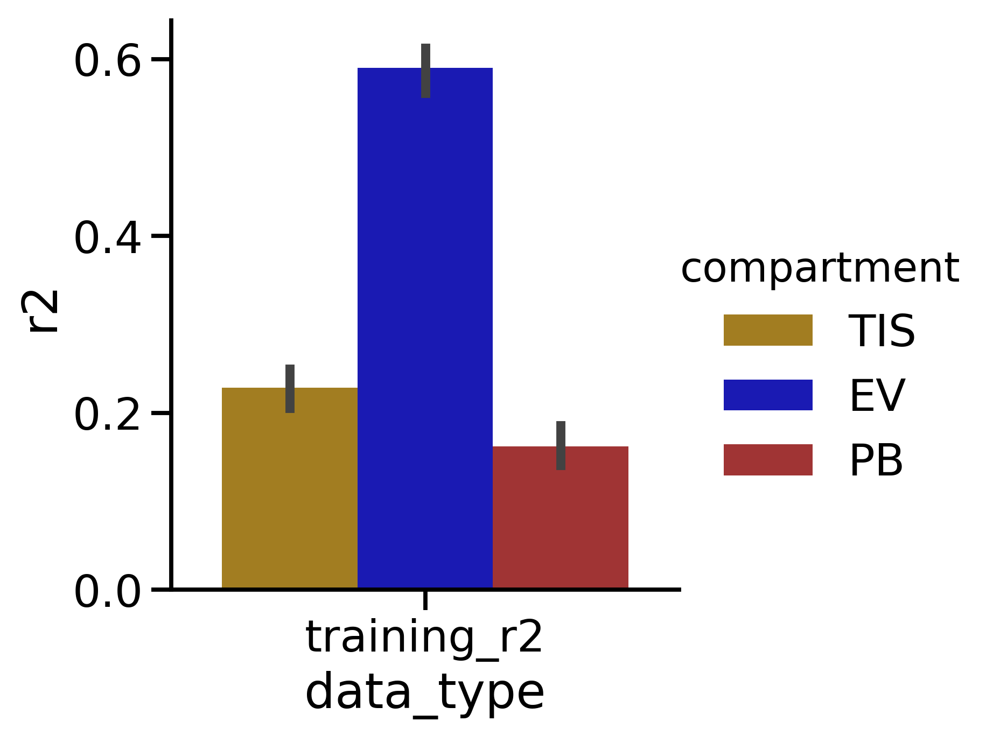

In [44]:
sns.catplot(x= 'data_type', y= 'r2', hue = 'compartment', hue_order = ['TIS', 'EV', 'PB'], 
            palette = {'PB':'firebrick', 'EV': 'mediumblue', 'TIS': 'darkgoldenrod'}, 
            kind = 'bar', data = r2_melt[r2_melt['data_type'] == 'training_r2'])

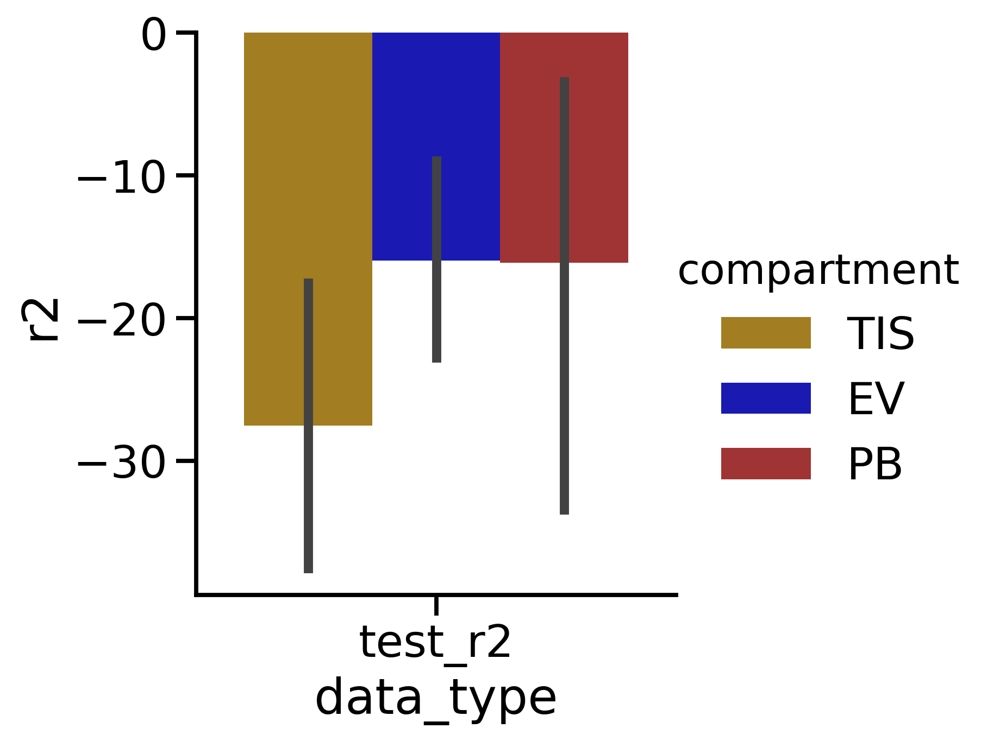

In [45]:
sns.catplot(x= 'data_type', y= 'r2', hue = 'compartment', hue_order = ['TIS', 'EV', 'PB'], 
            palette = {'PB':'firebrick', 'EV': 'mediumblue', 'TIS': 'darkgoldenrod'}, 
            kind = 'bar', data = r2_melt[r2_melt['data_type'] == 'test_r2'])

In [47]:
counts_piv.loc[:, 'stage'] = np.where(counts_piv.loc[:, 'float_day'] < 14.5, 'early', 'late')
counts_piv.to_csv(counts_filepath, index = False)
EV_early = counts_piv[(counts_piv['compartment2'] == 'PL-EV') & (counts_piv['stage'] == 'early')]
EV_early.reset_index(inplace = True)
EV_late = counts_piv[(counts_piv['compartment2'] == 'PL-EV') & (counts_piv['stage'] == 'late')]
EV_late.reset_index(inplace = True)
features = ['Monocytes','Neutrophils']
target = ['float_day']

In [48]:
ev_comp_dict = {'early': EV_early, 'late': EV_late}
ev_alpha_dict = {'early': 0.1, 'late': 0.1}

linear regression version

In [49]:
ev_mse_df = pd.DataFrame(columns = ['stage', 'training_n_mse', 'test_n_mse'])
ev_r2_df = pd.DataFrame(columns = ['stage', 'training_r2', 'test_r2'])

In [50]:
for stage in ev_comp_dict.keys():
    compartment_df = ev_comp_dict[stage]
    compartment_df.loc[:, features] = compartment_df.loc[:, features].apply(lambda x:(x-x.mean()) / (x.max()-x.min()))
    X = compartment_df.loc[:, features].values
    Y = compartment_df.loc[:, target].values
    clf = LinearRegression()
    scores = cross_validate(clf, X, Y, cv=10,
                         scoring=('r2', 'neg_mean_squared_error'),
                        return_train_score=True)
    error_df = pd.DataFrame({'stage':stage, 'training_n_mse': scores['train_neg_mean_squared_error'], 'test_n_mse': scores['test_neg_mean_squared_error']})
    ev_mse_df = ev_mse_df.append(error_df)
    acc_df = pd.DataFrame({'stage':stage, 'training_r2': scores['train_r2'], 'test_r2': scores['test_r2']})
    ev_r2_df = ev_r2_df.append(acc_df)

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [51]:
r2_melt = ev_r2_df.melt(id_vars = 'stage', value_vars = ['training_r2', 'test_r2'], var_name = 'data_type', value_name = 'r2')

In [53]:
r2_melt.head(5)

,stage,data_type,r2
0,early,training_r2,0.598120
1,early,training_r2,0.685449
2,early,training_r2,0.728045
3,early,training_r2,0.557435
4,early,training_r2,0.552417


In [56]:
stage_comb = ('early', 'late')
data_types = ['training_r2', 'test_r2']
t_test_r2 = pd.DataFrame(columns =['stage1','stage2', 'data_type', 't-stat', 'p-value', 'Stat diff'])
for data_type in data_types: 
        comb1 = r2_melt[(r2_melt['stage']== stage_comb[0]) &(r2_melt['data_type']== data_type)]
        comb2 = r2_melt[(r2_melt['stage']== stage_comb[1]) &(r2_melt['data_type']== data_type)]

        t_stat, p_value = ttest_ind(comb1['r2'], comb2['r2'])
        alpha = 0.05
        if p_value > alpha:
            dist = 'no'
        else:
            dist = 'yes'


        data_df = pd.DataFrame(data ={'stage1': stage_comb[0],
                                      'stage2': stage_comb[1],
                                      'data_type': data_type,
                                      't-stat': [t_stat], 
                                      'p-value': [p_value], 
                                      'Stat diff':[dist]})
        t_test_r2 = t_test_r2.append(data_df)

In [57]:
t_test_r2

,stage1,stage2,data_type,t-stat,p-value,Stat diff
0,early,late,training_r2,18.444175,3.879596e-13,yes
0,early,late,test_r2,2.683139,1.518537e-02,yes


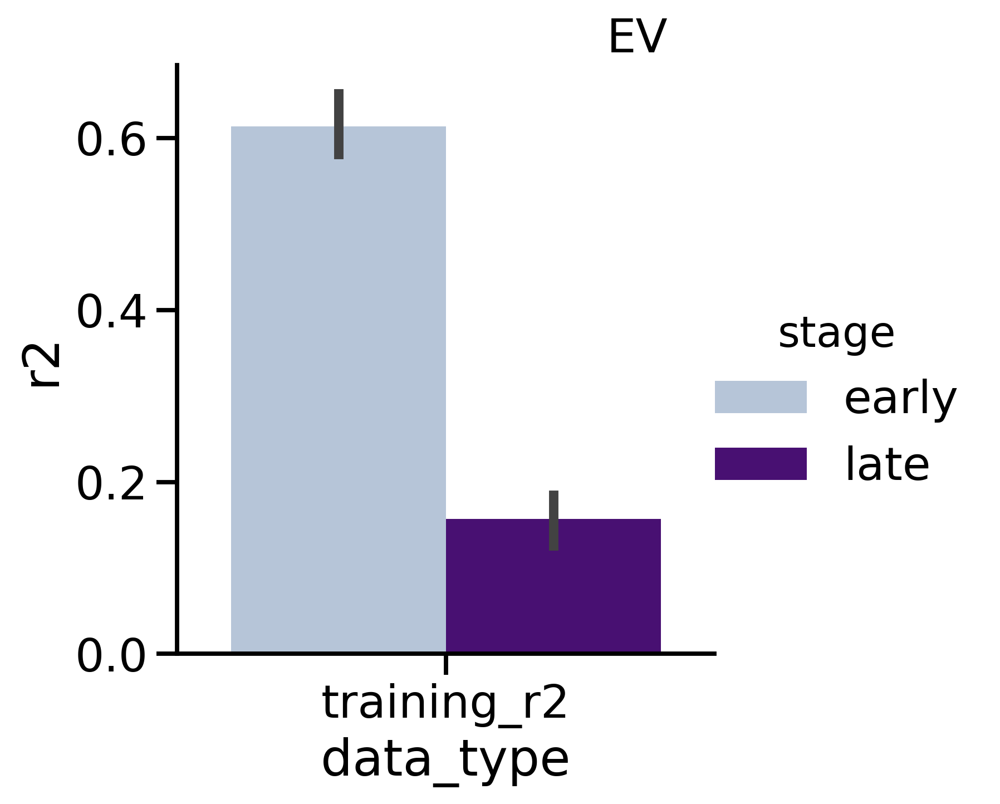

In [52]:
sns.catplot(x= 'data_type', y= 'r2', hue = 'stage',  palette = {'early':'lightsteelblue', 'late':'indigo'}, 
            kind = 'bar', data = r2_melt[r2_melt['data_type'] == 'training_r2'])
plt.text(0.3, 0.7,'EV', fontsize=20);

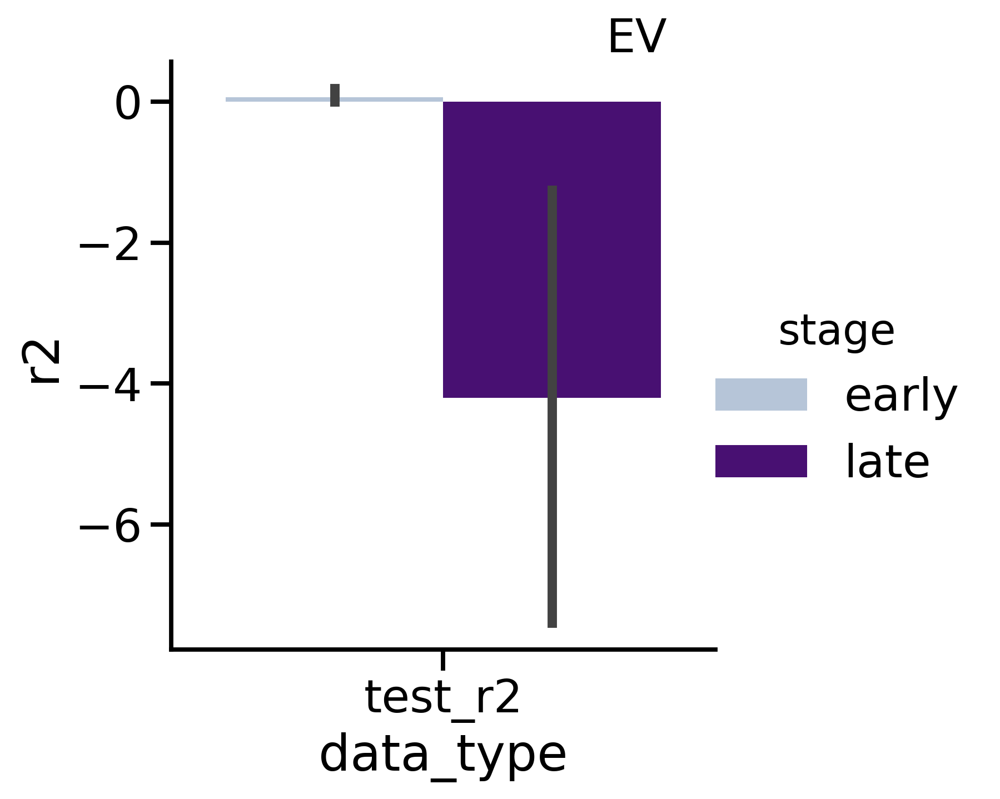

In [67]:
sns.catplot(x= 'data_type', y= 'r2', hue = 'stage',  palette = {'early':'lightsteelblue', 'late':'indigo'}, 
            kind = 'bar', data = r2_melt[r2_melt['data_type'] == 'test_r2'])
plt.text(0.3, 0.7,'EV', fontsize=20);

#  Figure 2F

In [58]:
import statsmodels.stats.multitest as sm

In [59]:
subsample_path = '/Users/bendalllab/Desktop/Maternal_cells/500_sub'
ttest_path2 = os.path.join(subsample_path, '20200706_t_test_all_markers_all_days.csv')
t_test_data2 = pd.read_csv(ttest_path2)

In [60]:
t_test_data2.head(5)

,marker,compartment2,cell_type_v2,log2_latedivearly,t-stat,p-value,Stat diff,adj_p_val,reject
0,IdU,PB-EV,B cells,-0.430860,0.756622,0.454645,no,1.0,False
1,IdU,PB-EV,Basophils,0.786023,-1.274802,0.212165,no,1.0,False
2,IdU,PB-EV,CD4+ T cells,-0.197529,0.337755,0.737687,no,1.0,False
3,IdU,PB-EV,CD8+ T cells,1.208943,-2.337375,0.025635,yes,1.0,False
4,IdU,PB-EV,Eosinophils,-0.411128,0.578719,0.566830,no,1.0,False


In [61]:
neutrophils_only = t_test_data2[(t_test_data2['cell_type_v2'] == 'Neutrophils') & (~(t_test_data2['marker'].isin(['CTLA-4'])))]
monocytes_only = t_test_data2[(t_test_data2['cell_type_v2'] == 'Monocytes') & (~(t_test_data2['marker'].isin(['CD194', 'CTLA-4'])))]

now only use markers that are expressed in the cells

In [62]:
subsample_path = '/Users/bendalllab/Desktop/Maternal_cells/500_sub'
medians_csv = '20200630_maternal500wo_outliers_bl_medians_per_sample.csv'
medians_filepath = os.path.join(subsample_path, medians_csv)
medians_df = pd.read_csv(medians_filepath)

In [107]:
mo_medians = medians_df[(medians_df['cell_type_v2']== 'Monocytes')]
neutro_medians = medians_df[(medians_df['cell_type_v2']=='Neutrophils')]

In [72]:
mo_medians.head(5)

,marker,cell_type_v2,compartment2,day,cage,id,median,sample,float_day
3019,IdU,Monocytes,PB-EV,E10.5,6942,8,0.088816,6942_8_E10.5_PB-EV,10.5
3020,IdU,Monocytes,PB-EV,E10.5,6943,15,0.022727,6943_15_E10.5_PB-EV,10.5
3021,IdU,Monocytes,PB-EV,E10.5,6944,16,0.008484,6944_16_E10.5_PB-EV,10.5
3022,IdU,Monocytes,PB-EV,E10.5,6944,17,0.022727,6944_17_E10.5_PB-EV,10.5
3023,IdU,Monocytes,PB-EV,E10.5,9582,15,0.124751,9582_15_E10.5_PB-EV,10.5


In [127]:
neutro_medians['expressed'] = 'no'
neu_expressed_mask = (neutro_medians['median'] > 1)
neutro_medians['expressed'][neu_expressed_mask] = 'yes'

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [128]:
neutro_medians[neutro_medians['expressed'] == 'yes']['marker'].unique()

array(['CD45-retroorbital', 'CD45.2', 'IdU', 'B220', 'Ly-6G', 'TCRb',
       'CD115', 'CD3', 'IgD', 'CD19', 'CD25', 'CD64', 'CD80', 'CD11b',
       'CD40', 'Ly-6C', 'CD194', 'CD62L', 'PD-L1', 'Siglec-F', 'CD68',
       'CD49b', 'CD44', 'CD4', 'MHCII', 'umap1'], dtype=object)

In [129]:
mo_medians['expressed'] = 'no'
mo_expressed_mask = (mo_medians['median'] > 1)
mo_medians['expressed'][mo_expressed_mask] = 'yes'

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [130]:
mo_medians[mo_medians['expressed'] == 'yes']['marker'].unique()

array(['CD45-retroorbital', 'CD45.2', 'IdU', 'B220', 'CD11c', 'CD115',
       'F480', 'CD64', 'CD80', 'CD11b', 'CD40', 'IgM', 'FOXP3', 'CTLA-4',
       'Ly-6C', 'CD194', 'CD62L', 'PD-L1', 'CD68', 'CD49b', 'CD44', 'CD4',
       'MHCII', 'umap1', 'umap2'], dtype=object)

In [131]:
mono_markers = ['IdU', 'B220', 'CD11c', 'CD115',
       'F480', 'CD64', 'CD80', 'CD11b', 'CD40','Ly-6C', 
                'CD62L', 'PD-L1', 'CD68', 'CD49b', 'CD44', 'CD4','MHCII']

In [132]:
neutro_markers = ['IdU', 'B220', 'Ly-6G','CD80', 'CD11b',
       'CD40', 'Ly-6C', 'CD62L', 'PD-L1', 'CD49b', 'CD44']

In [133]:
mo_medians = medians_df[(medians_df['cell_type_v2']== 'Monocytes') & medians_df['marker'].isin(mono_markers)]
neutro_medians = medians_df[(medians_df['cell_type_v2']=='Neutrophils') & medians_df['marker'].isin(neutro_markers)]

In [134]:
neutrophils_only = t_test_data2[(t_test_data2['cell_type_v2'] == 'Neutrophils') & t_test_data2['marker'].isin(neutro_markers)]
monocytes_only = t_test_data2[(t_test_data2['cell_type_v2'] == 'Monocytes') & t_test_data2['marker'].isin(mono_markers)]

In [135]:
neu_adjust_pval = sm.multipletests(neutrophils_only['p-value'].values, alpha=0.05, method='bonferroni', is_sorted=False, returnsorted=False)
mo_adjust_pval = sm.multipletests(monocytes_only['p-value'].values, alpha=0.05, method='bonferroni', is_sorted=False, returnsorted=False)

In [136]:
neutrophils_only.loc[:, 'reject'] = neu_adjust_pval[0]
neutrophils_only.loc[:, 'adj_p_val'] = neu_adjust_pval[1]
monocytes_only.loc[:, 'reject'] = mo_adjust_pval[0]
monocytes_only.loc[:, 'adj_p_val'] = mo_adjust_pval[1]

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [137]:
neutrophils_only['neg_log10_pval'] = -np.log10(neutrophils_only['p-value'])
monocytes_only['neg_log10_pval'] = -np.log10(monocytes_only['p-value'])

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [138]:
neutrophils_only['adj_neg_log10_pval'] = -np.log10(neutrophils_only['adj_p_val'])
monocytes_only['adj_neg_log10_pval'] = -np.log10(monocytes_only['adj_p_val'])

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [139]:
monocytes_only.head(5)

,marker,compartment2,cell_type_v2,log2_latedivearly,t-stat,p-value,Stat diff,adj_p_val,reject,neg_log10_pval,adj_neg_log10_pval
5,IdU,PB-EV,Monocytes,-0.919820,1.033929,0.308687,no,1.000000,False,0.510481,-0.000000
13,IdU,PL-EV,Monocytes,-0.717624,2.560243,0.015074,yes,0.768763,False,1.821777,0.114207
21,IdU,PL-T,Monocytes,-0.560642,2.025318,0.050743,no,1.000000,False,1.294627,-0.000000
29,B220,PB-EV,Monocytes,-0.014732,0.096075,0.924042,no,1.000000,False,0.034308,-0.000000
37,B220,PL-EV,Monocytes,-0.100688,0.777366,0.442318,no,1.000000,False,0.354265,-0.000000


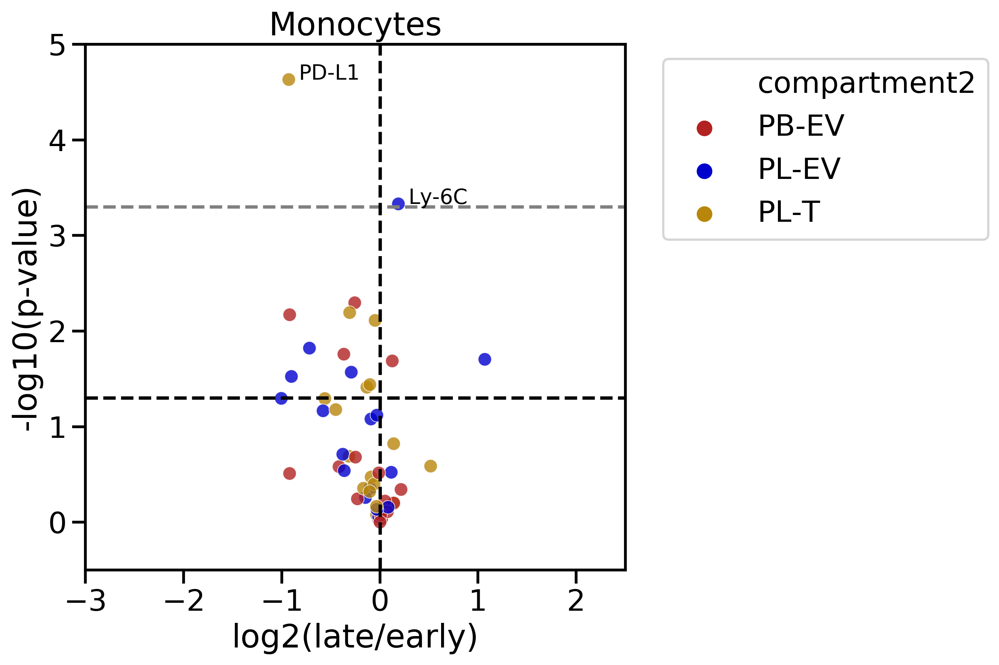

In [145]:
f, ax = plt.subplots(figsize=(6.5, 6.5))
sns.scatterplot(x= 'log2_latedivearly', y='neg_log10_pval',
                     hue='compartment2', palette = {'PB-EV':'firebrick', 'PL-EV': 'mediumblue', 'PL-T': 'darkgoldenrod'}, 
                data=monocytes_only,  marker='o', linewidth = 0.5, alpha = 0.8, ax = ax)
plt.title('Monocytes')
plt.xlabel('log2(late/early)')
plt.ylabel('-log10(p-value)')
plt.xlim(-3, 2.5)
plt.ylim(-0.5, 5)
ax.legend(bbox_to_anchor=(1.7, 1))
plt.axhline(y=1.301, color='k', linestyle='--')
plt.axhline(y=3.301, color='grey', linestyle='--')
plt.axvline(x=0, color='k', linestyle='--')
for i, point, in monocytes_only.iterrows():
    if (point['reject'] == True) and (point['marker'] in ['PD-L1', 'Ly-6C']):
        ax.text(point['log2_latedivearly']+ 0.1, point['neg_log10_pval'], point['marker'], fontsize=14)


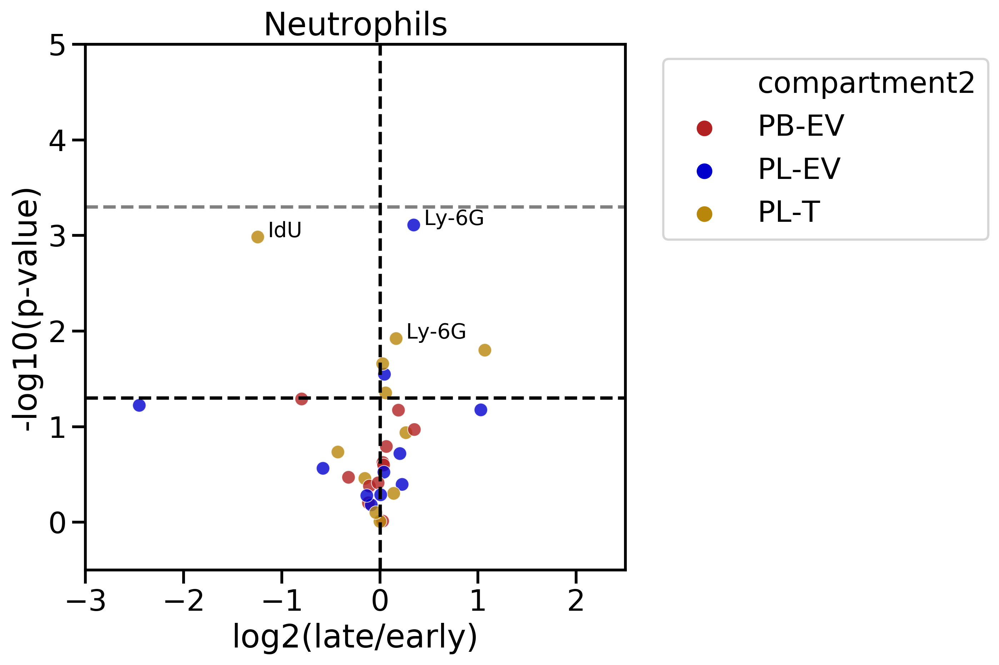

In [146]:
f, ax = plt.subplots(figsize=(6.5, 6.5))
sns.scatterplot(x= 'log2_latedivearly', y='neg_log10_pval',
                     hue='compartment2', palette = {'PB-EV':'firebrick', 'PL-EV': 'mediumblue', 'PL-T': 'darkgoldenrod'}, 
                data=neutrophils_only,  marker='o', linewidth = 0.5, alpha = 0.8, ax = ax)
plt.title('Neutrophils')
plt.xlabel('log2(late/early)')
plt.ylabel('-log10(p-value)')
plt.xlim(-3, 2.5)
plt.ylim(-0.5, 5)
ax.legend(bbox_to_anchor=(1.7, 1))
plt.axhline(y=1.301, color='k', linestyle='--')
plt.axhline(y=3.301, color='grey', linestyle='--')
plt.axvline(x=0, color='k', linestyle='--')
for i, point, in neutrophils_only.iterrows():
    if (point['Stat diff'] == 'yes') and (point['marker'] in ['Ly-6G', 'IdU']):
        ax.text(point['log2_latedivearly']+ 0.1, point['neg_log10_pval'], point['marker'], fontsize=14)

# Figure 2G

In [147]:
subsample_path = '/Users/bendalllab/Desktop/Maternal_cells/500_sub'
medians_csv = '20200630_maternal500wo_outliers_bl_medians_per_sample.csv'
medians_filepath = os.path.join(subsample_path, medians_csv)
medians_df = pd.read_csv(medians_filepath)

In [148]:
mono_df = medians_df[(medians_df['cell_type_v2'] == 'Monocytes') & medians_df['marker'].isin(['Ly-6C','PD-L1'])]
neu_df = medians_df[(medians_df['cell_type_v2'] == 'Neutrophils') & medians_df['marker'].isin(['Ly-6G','IdU'])]

In [149]:
comp_dict = {'PB-EV':'firebrick', 'PL-EV': 'mediumblue', 'PL-T': 'darkgoldenrod'}

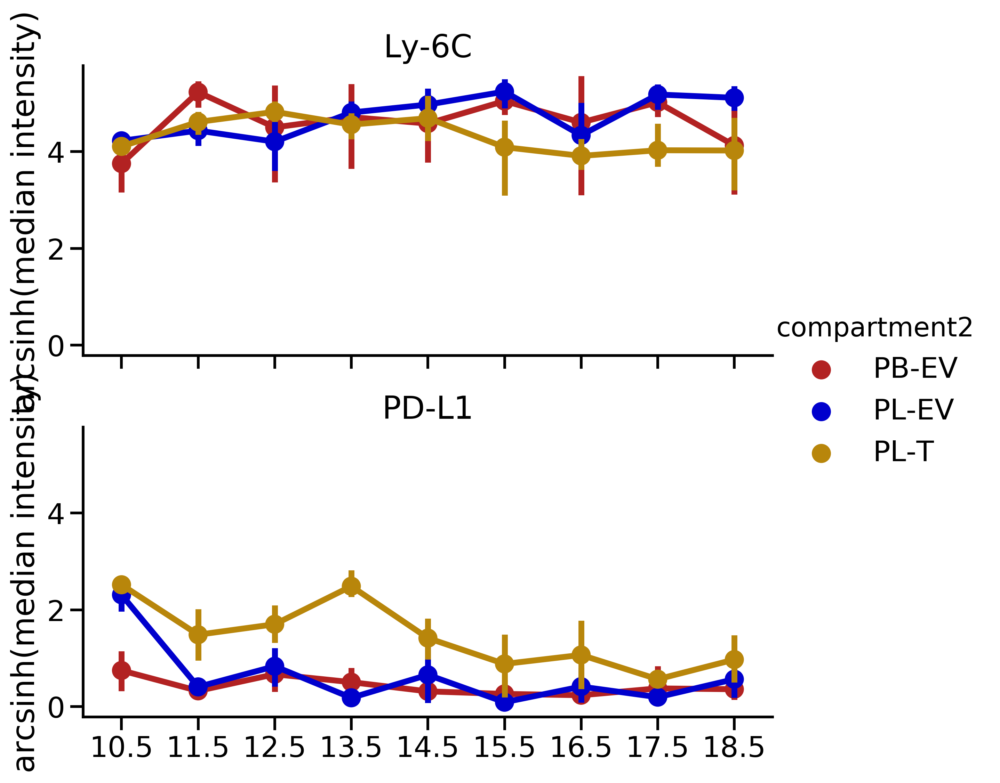

In [150]:
g = sns.catplot(x='float_day', y='median', hue='compartment2', row = 'marker', height=4, aspect=2, sharey= True,
               data=mono_df, kind='point', palette = comp_dict)
(g.set_axis_labels('', 'arcsinh(median intensity)')
  .set_titles('{row_name}'))  

In [151]:
mono_df.head(5)

,marker,cell_type_v2,compartment2,day,cage,id,median,sample,float_day
21389,Ly-6C,Monocytes,PB-EV,E10.5,6942,8,4.005639,6942_8_E10.5_PB-EV,10.5
21390,Ly-6C,Monocytes,PB-EV,E10.5,6943,15,3.570775,6943_15_E10.5_PB-EV,10.5
21391,Ly-6C,Monocytes,PB-EV,E10.5,6944,16,4.606073,6944_16_E10.5_PB-EV,10.5
21392,Ly-6C,Monocytes,PB-EV,E10.5,6944,17,3.821058,6944_17_E10.5_PB-EV,10.5
21393,Ly-6C,Monocytes,PB-EV,E10.5,9582,15,2.762270,9582_15_E10.5_PB-EV,10.5


In [154]:
days = [('E10.5', 'E13.5'), ('E13.5', 'E18.5'), ('E18.5', 'E10.5')]
combos = [('PL-T', 'PL-EV'), ('PL-EV', 'PB-EV'), ('PB-EV', 'PL-T')]
markers = ['Ly-6C', 'PD-L1']
t_test_mo_marker = pd.DataFrame(columns =['marker', 'comp_only','day1', 'day2', 't-stat_day', 'p-value_day', 'Stat diff day', 'comp1', 'comp2', 'day_only', 't-stat_comp', 'p-value_comp', 'Stat diff comp'])

for marker in markers:   
    for comb in combos:
        for day in days: 
                day1 = mono_df[(mono_df['marker']== marker) & 
                                        (mono_df['compartment2']== comb[0])&
                                        (mono_df['day']== day[0])]
                day2 = mono_df[(mono_df['marker']== marker) & 
                                        (mono_df['compartment2']== comb[0])&
                                        (mono_df['day']== day[1])]

                t_stat_day, p_day = ttest_ind(day1['median'], day2['median'])
                alpha = 0.05
                if p_day > alpha:
                    dist_day = 'no'
                else:
                    dist_day = 'yes'

                comp_1 = mono_df[(mono_df['marker']== marker) & 
                                        (mono_df['compartment2']== comb[0])&
                                        (mono_df['day']== day[0])]
                comp_2 = mono_df[(mono_df['marker']== marker) & 
                                        (mono_df['compartment2']== comb[1])&
                                        (mono_df['day']== day[0])]

                t_stat_comp, p_comp = ttest_ind(comp_1['median'], comp_2['median'])
                alpha = 0.05
                if p_comp > alpha:
                    dist_comp = 'no'
                else:
                    dist_comp = 'yes'


                data_df = pd.DataFrame(data ={'marker': [marker],
                                              'comp_only': [comb[0]],
                                              'day1':[day[0]],
                                              'day2':[day[1]],
                                              't-stat_day': [t_stat_day], 
                                              'p-value_day': [p_day], 
                                              'Stat diff day':[ dist_day],
                                              'comp1': [comb[0]],
                                              'comp2': [comb[1]],
                                              'day_only':[day[0]],
                                              't-stat_comp': [t_stat_comp], 
                                              'p-value_comp': [p_comp], 
                                              'Stat diff comp':[ dist_comp]})
                t_test_mo_marker = t_test_mo_marker.append(data_df)

In [156]:
t_test_mo_marker

,marker,comp_only,day1,day2,t-stat_day,p-value_day,Stat diff day,comp1,comp2,day_only,t-stat_comp,p-value_comp,Stat diff comp
0,Ly-6C,PL-T,E10.5,E13.5,-3.171087,0.033823,yes,PL-T,PL-EV,E10.5,-1.587531,0.187585,no
0,Ly-6C,PL-T,E13.5,E18.5,0.949770,0.373859,no,PL-T,PL-EV,E13.5,-1.635514,0.177281,no
0,Ly-6C,PL-T,E18.5,E10.5,-0.151362,0.883960,no,PL-T,PL-EV,E18.5,-2.739331,0.020857,yes
0,Ly-6C,PL-EV,E10.5,E13.5,-6.302506,0.003240,yes,PL-EV,PB-EV,E10.5,1.172925,0.285279,no
0,Ly-6C,PL-EV,E13.5,E18.5,-1.701569,0.132626,no,PL-EV,PB-EV,E13.5,0.185569,0.861813,no
0,Ly-6C,PL-EV,E18.5,E10.5,5.222718,0.001222,yes,PL-EV,PB-EV,E18.5,2.164071,0.058677,no
0,Ly-6C,PB-EV,E10.5,E13.5,-1.756895,0.129450,no,PB-EV,PL-T,E10.5,-0.878128,0.413652,no
0,Ly-6C,PB-EV,E13.5,E18.5,0.786717,0.461381,no,PB-EV,PL-T,E13.5,0.295703,0.782172,no
0,Ly-6C,PB-EV,E18.5,E10.5,0.654948,0.530878,no,PB-EV,PL-T,E18.5,0.169913,0.868836,no
0,PD-L1,PL-T,E10.5,E13.5,0.204479,0.847962,no,PL-T,PL-EV,E10.5,1.218485,0.289989,no


# Figure 2H

In [157]:
subsample_path = '/Users/bendalllab/Desktop/Maternal_cells/500_sub'
umap_path = os.path.join(subsample_path, '20200508_maternal500_fetal_wo_outliers.csv')
adata_df= pd.read_csv(umap_path)

/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3049: DtypeWarning: Columns (42) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


/Library/Frameworks/Python.framework/Versions/3.7/lib/python3.7/site-packages/pandas/core/frame.py:3391: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]


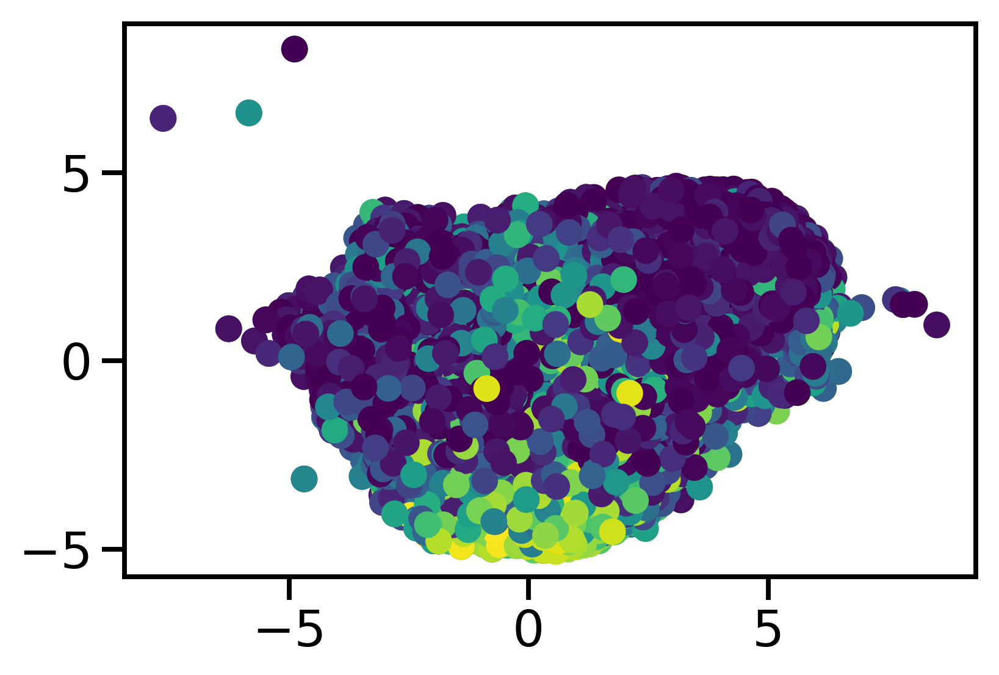

In [158]:
clean_df = adata_df[(adata_df['test_status'] == 'test') & 
                    adata_df['organ'].isin(['PB', 'PL_F', 'PL_M'])]
mono_df = clean_df[(clean_df['challenge'] == 'sal') & (clean_df['timePI'] == '2hr') & (clean_df['origin'] == 'maternal')& (clean_df['cell_type_v2'] == 'Monocytes')]
int_markers = ['Ly-6C','PD-L1']
mono_df[int_markers] = mono_df[int_markers].apply(lambda x:(x-x.min()) / (x.max()-x.min()))
adata_melt= mono_df.melt(id_vars=['compartment2','cell_type_v2', 'cage','id', 'day', 'umap1', 'umap2'], value_vars = int_markers)
adata_melt.rename(columns = {'variable': 'marker', 'value': 'median'}, inplace = True)
points = plt.scatter(adata_melt['umap1'], adata_melt['umap2'], c = adata_melt['median'], cmap='viridis')

In [159]:
adata_melt.loc[:, 'stage'] = np.where(adata_melt.loc[:, 'day'].isin(['E10.5', 'E11.5','E12.5', 'E13.5']), 'early', 'late')

In [160]:
adata_melt.head(5)

,compartment2,cell_type_v2,cage,id,day,umap1,umap2,marker,median,stage
0,PL-EV,Monocytes,9582,14,E15.5,1.797786,-1.826254,Ly-6C,0.670374,late
1,PL-EV,Monocytes,9582,14,E15.5,-2.867521,0.332538,Ly-6C,0.435592,late
2,PL-T,Monocytes,9582,14,E15.5,-0.955799,-1.288894,Ly-6C,0.070589,late
3,PL-EV,Monocytes,9582,14,E15.5,3.145008,1.840034,Ly-6C,0.720508,late
4,PL-T,Monocytes,9582,14,E15.5,0.763425,-2.356456,Ly-6C,0.566863,late


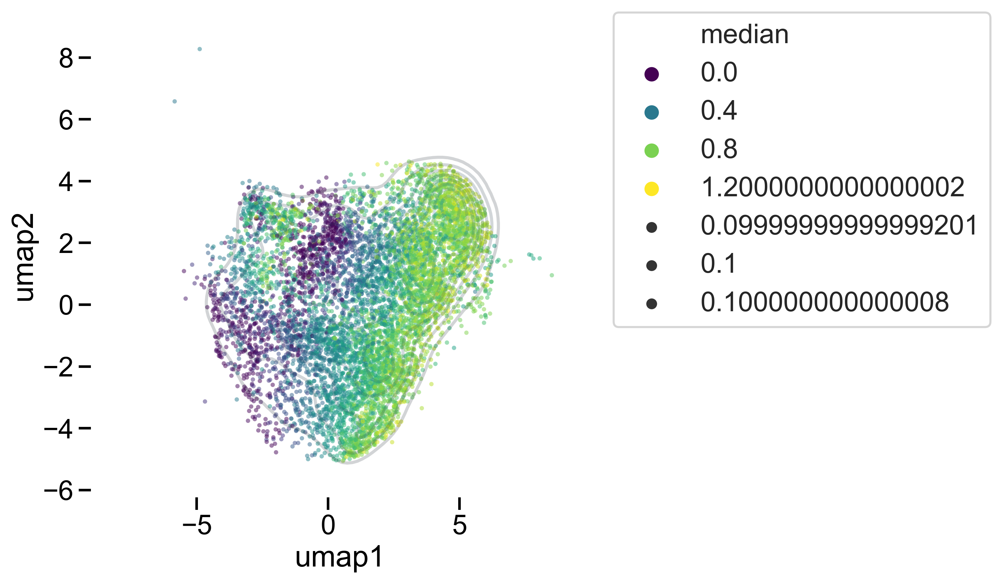

In [162]:
f, ax = plt.subplots(figsize=(6.5, 6.5))
sns.kdeplot(data = adata_melt['umap1'], data2= adata_melt['umap2'], shade = False, 
            shade_lowest=False, ax = ax, alpha = 0.2, cbar = False)
sns.scatterplot(data = adata_melt[(adata_melt['stage']== 'early') & (adata_melt['marker']== 'Ly-6C')], hue = 'median', palette = 'viridis', x='umap1', y='umap2', marker='.', size = 0.1, linewidth = 0, alpha = 0.5, ax = ax)
sns.despine(f, left=True, bottom=True)
sns.set_style("whitegrid", {'axes.grid' : False})
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

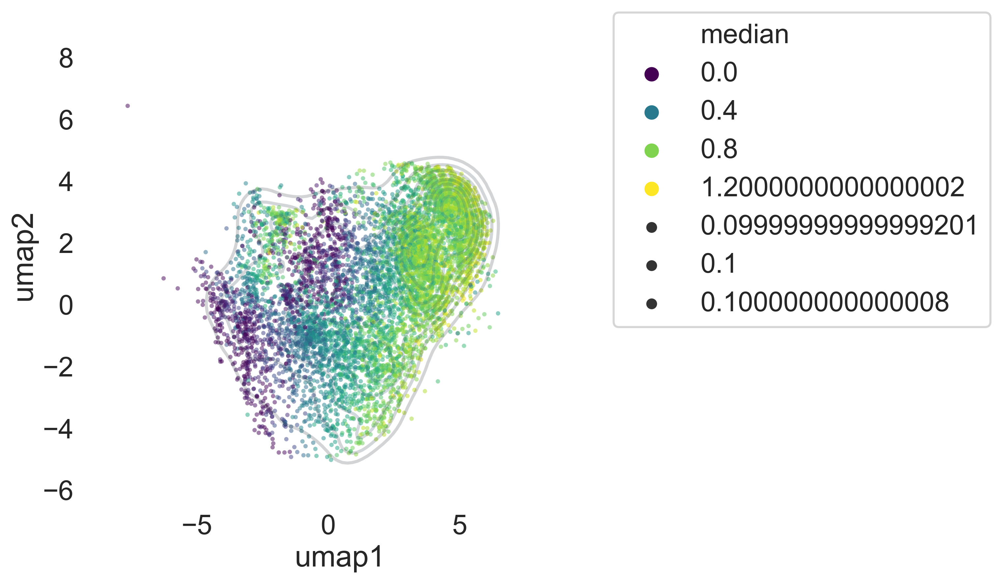

In [163]:
f, ax = plt.subplots(figsize=(6.5, 6.5))
sns.kdeplot(data = adata_melt['umap1'], data2= adata_melt['umap2'], shade = False, 
            shade_lowest=False, ax = ax, alpha = 0.2, cbar = False)
sns.scatterplot(data = adata_melt[(adata_melt['stage']== 'late') & (adata_melt['marker']== 'Ly-6C')], hue = 'median', palette = 'viridis', x='umap1', y='umap2', marker='.', size = 0.1, linewidth = 0, alpha = 0.5, ax = ax)
sns.despine(f, left=True, bottom=True)
sns.set_style("whitegrid", {'axes.grid' : False})
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

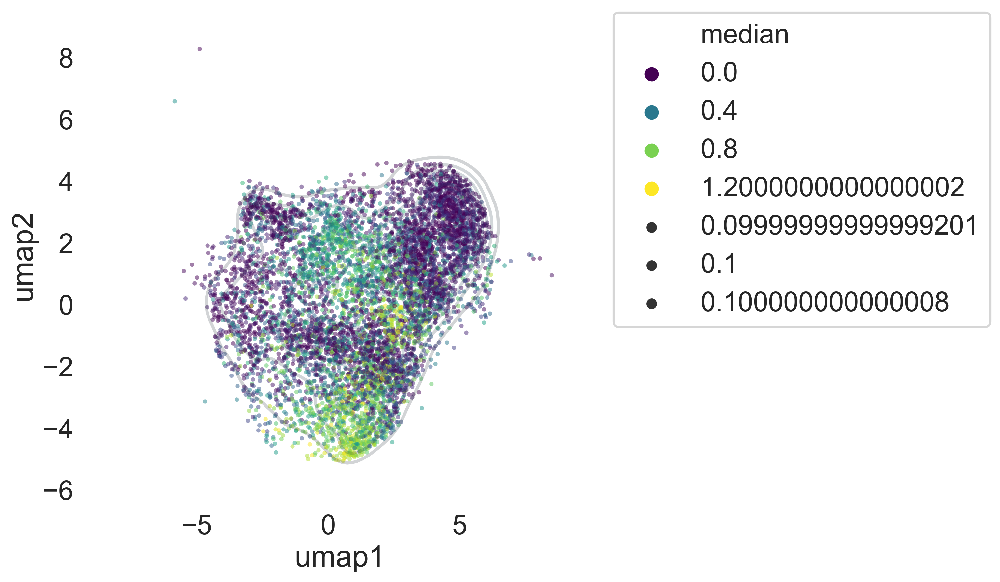

In [164]:
f, ax = plt.subplots(figsize=(6.5, 6.5))
sns.kdeplot(data = adata_melt['umap1'], data2= adata_melt['umap2'], shade = False, 
            shade_lowest=False, ax = ax, alpha = 0.2, cbar = False)
sns.scatterplot(data = adata_melt[(adata_melt['stage']== 'early') & (adata_melt['marker']== 'PD-L1')], hue = 'median', palette = 'viridis', x='umap1', y='umap2', marker='.', size = 0.1, linewidth = 0, alpha = 0.5, ax = ax)
sns.despine(f, left=True, bottom=True)
sns.set_style("whitegrid", {'axes.grid' : False})
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

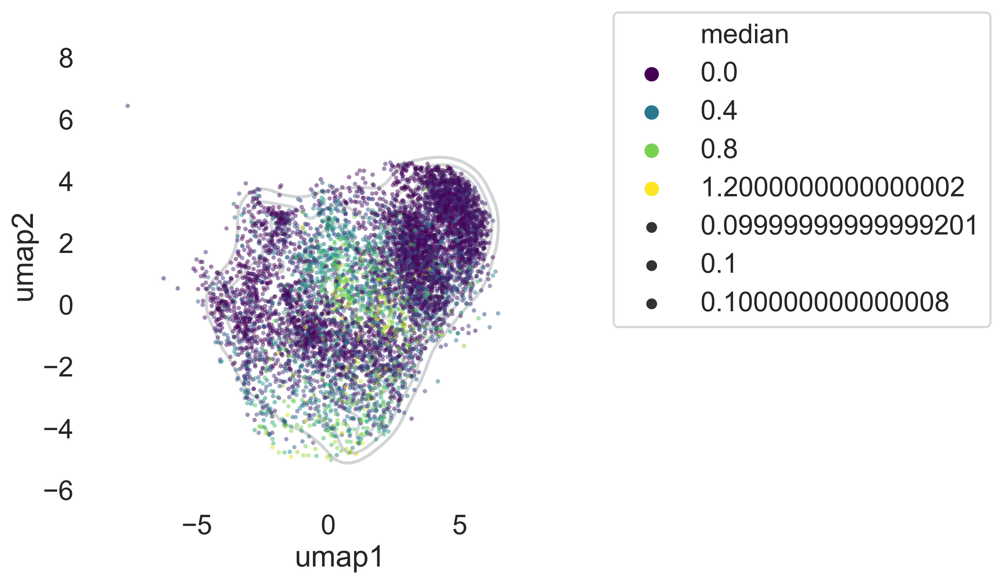

In [165]:
f, ax = plt.subplots(figsize=(6.5, 6.5))
sns.kdeplot(data = adata_melt['umap1'], data2= adata_melt['umap2'], shade = False, 
            shade_lowest=False, ax = ax, alpha = 0.2, cbar = False)
sns.scatterplot(data = adata_melt[(adata_melt['stage']== 'late') & (adata_melt['marker']== 'PD-L1')], hue = 'median', palette = 'viridis', x='umap1', y='umap2', marker='.', size = 0.1, linewidth = 0, alpha = 0.5, ax = ax)
sns.despine(f, left=True, bottom=True)
sns.set_style("whitegrid", {'axes.grid' : False})
ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

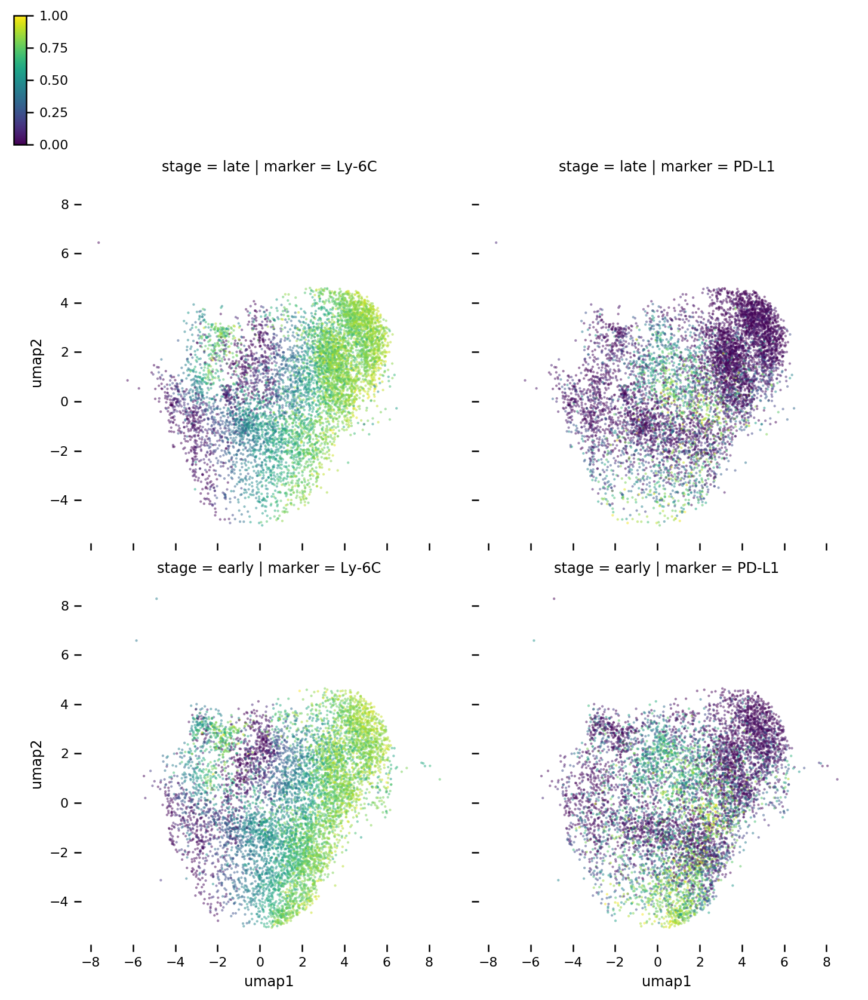

In [18]:
sns.set_context('paper', font_scale= 1)
g = sns.relplot(x='umap1', y= 'umap2', hue = 'median', col= 'marker', row = 'stage', data= adata_melt,
                height=4, aspect=1, kind="scatter", palette = 'viridis', 
                marker='.', size = 0.1, linewidth = 0, alpha = 0.5, legend = False)
cax = g.fig.add_axes([0, 1, 0.015, 0.15])
plt.colorbar(points, cax=cax)
#(g.set_axis_labels('UMAP1', 'UMAP2')
  #.set_titles('{col_name}'))
sns.despine(left = True, bottom = True)